In [1]:
# Here is the imports
import os

os.environ['TF_GPU_THREAD_MODE'] = 'gpu_private'
FLAGS = ["verbose"] # tensorboard, mixed_precision
from tensorflow import keras
import numpy as np
import tensorflow as tf
from tensorflow.keras import backend as K
#physical_devices = tf.config.list_physical_devices('GPU')
#tf.config.experimental.set_memory_growth(physical_devices[0], True)
import albumentations as A
if "mixed_precision" in FLAGS:
    print(f"PreTrain: Using Mixed Policy float16")
    keras.mixed_precision.set_global_policy('mixed_float16')
# keras.mixed_precision.set_global_policy('mixed_float16') normally this would provide extra speed for the model
# but in the case of 1660ti gpus they seem like they have tensor cores even they don't thus it slows down the model use this on higher powered models
from matplotlib import pyplot as plt
AUTOTUNE = tf.data.AUTOTUNE
from tensorflow.keras.models import load_model
from tqdm import tqdm
import cv2
import pandas as pd

In [3]:
# Dataset Constants
test_dir = './data/test/'
save_dir = './results/'
IMG_EXT = 'png'
BATCH_SIZE = 1
LR = 0.0001

MODEL_LOAD_TYPE = 'model' # model or weights
#MODEL_LOAD_TYPE = 'weights' # model or weights

# !! NOTE !! all_time_best models are correct but other models have inverted values


#MODEL_WEIGHT_PATH = "./models/14_09-07_21/best.h5"
#MODEL_WEIGHT_PATH = "./models/10_09-01_27/best_01_27_10_09.h5"
#MODEL_WEIGHT_PATH = "./models/15_09-07_18/best.h5"
MODEL_WEIGHT_PATH = "./models/all_time_best/best.h5"

In [5]:
# helper function for data visualization
def visualize(**images):
    """Plot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        # if whole binary image is true plt shows it as whole image is false so for bypassing this issue we assing one pixels value to 0
        image[1,1] = 0 
        plt.imshow(image)
    plt.show()

def visualize_dataset(img, mask, classes):
    kwarg = {'image': img}
    for i in range(len(classes)):
        kwarg.update({classes[i] : mask[..., i].squeeze()})
    visualize(**kwarg)

# helper function for data visualization    
def denormalize(x):
    """Scale image to range 0..1 for correct plot"""
    x_max = np.percentile(x, 98)
    x_min = np.percentile(x, 2)    
    x = (x - x_min) / (x_max - x_min)
    x = x.clip(0, 1)
    return x

In [6]:
model = load_model(MODEL_WEIGHT_PATH)

2021-09-23 08:16:22.714720: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-23 08:16:22.744945: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-23 08:16:22.745455: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-09-23 08:16:22.746681: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
202

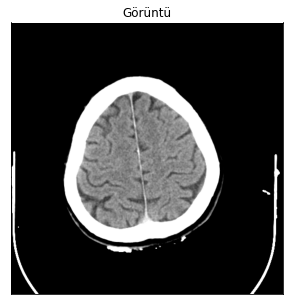

Prediction: False


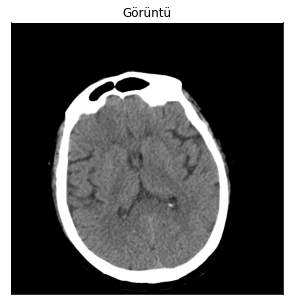

Prediction: False


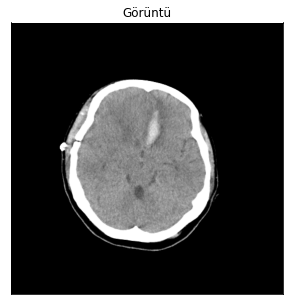

Prediction: True


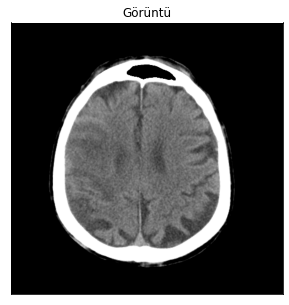

Prediction: True


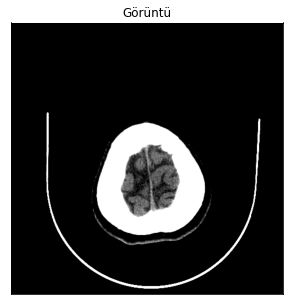

Prediction: False


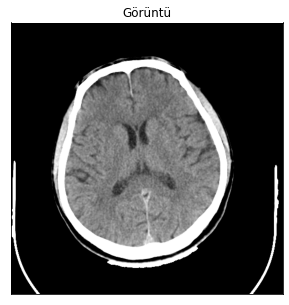

Prediction: False


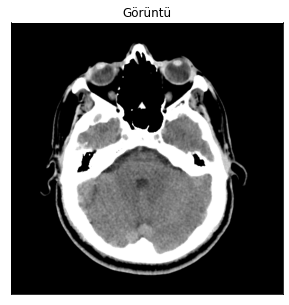

Prediction: False


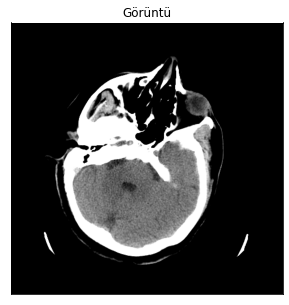

Prediction: False


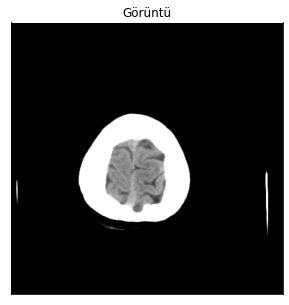

Prediction: False


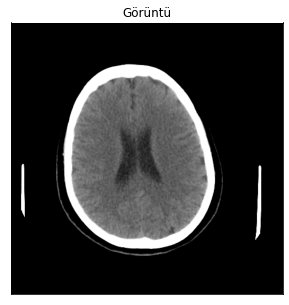

Prediction: False


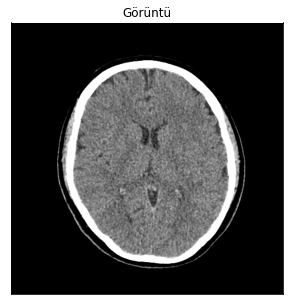

Prediction: False


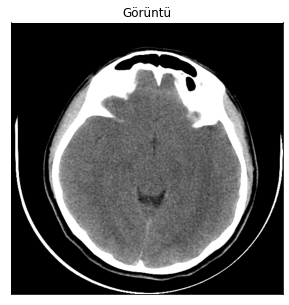

Prediction: False


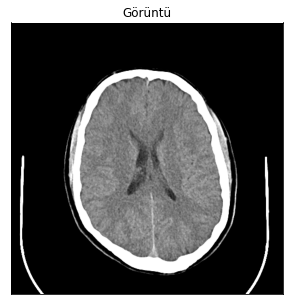

Prediction: False


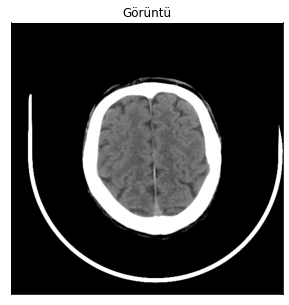

Prediction: False


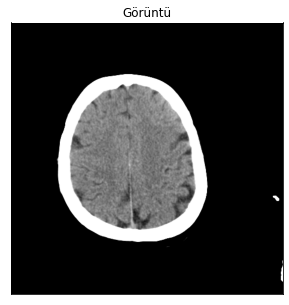

Prediction: False


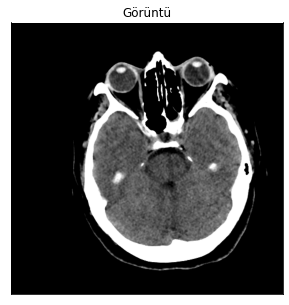

Prediction: False


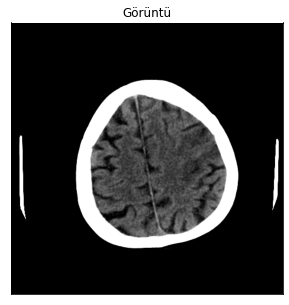

Prediction: True


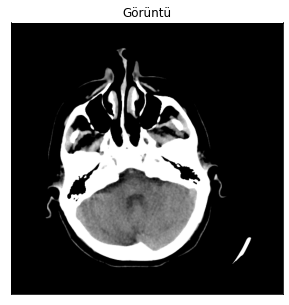

Prediction: False


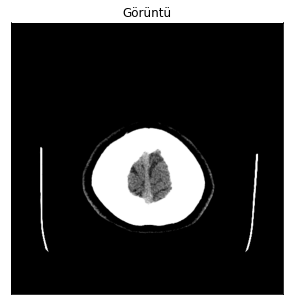

Prediction: False


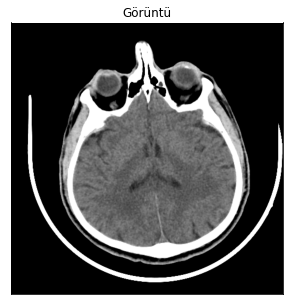

Prediction: False


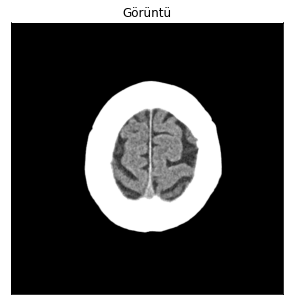

Prediction: False


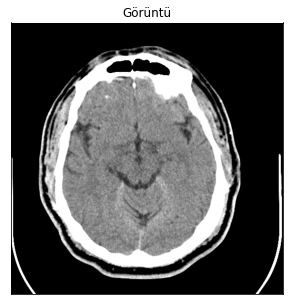

Prediction: False


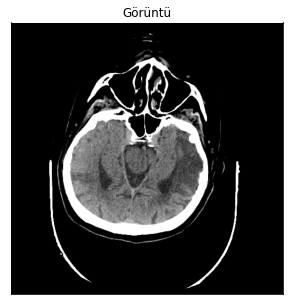

Prediction: True


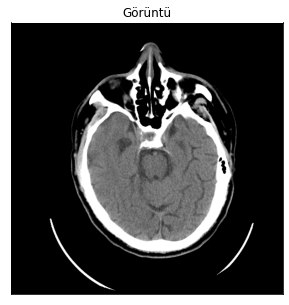

Prediction: False


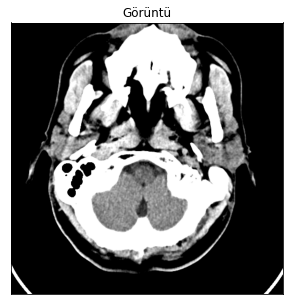

Prediction: False


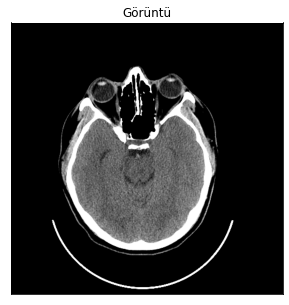

Prediction: False


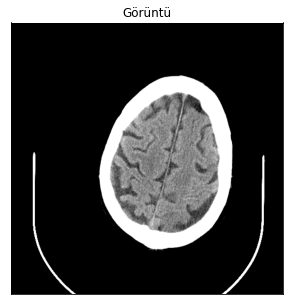

Prediction: True


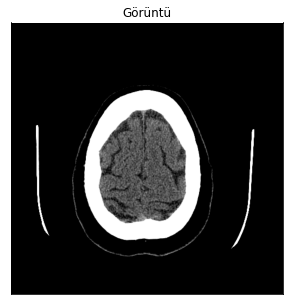

Prediction: False


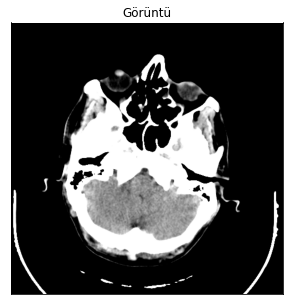

Prediction: False


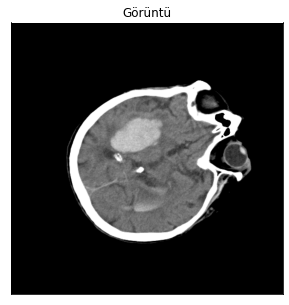

Prediction: True


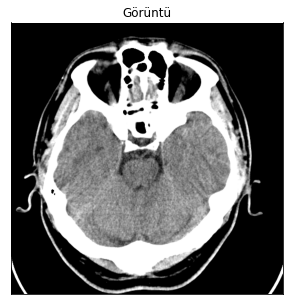

Prediction: False


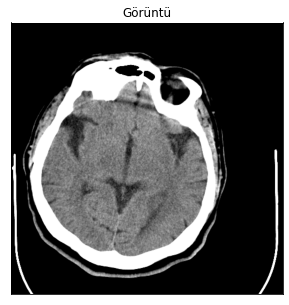

Prediction: False


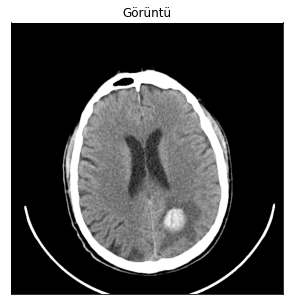

Prediction: True


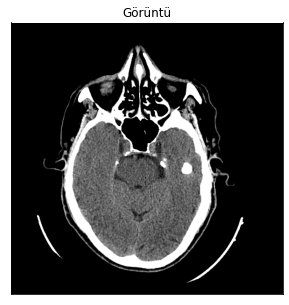

Prediction: False


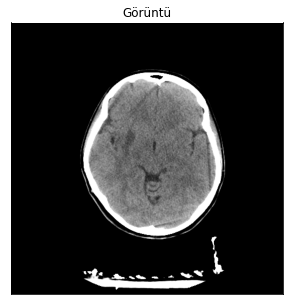

Prediction: True


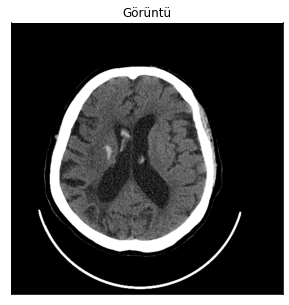

Prediction: True


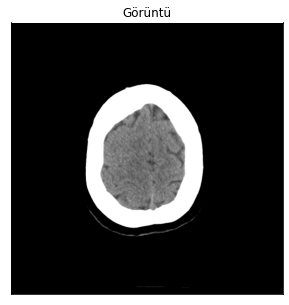

Prediction: False


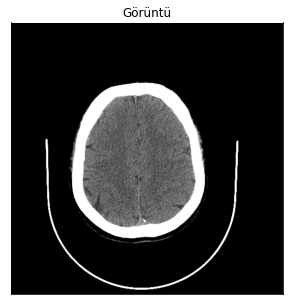

Prediction: False


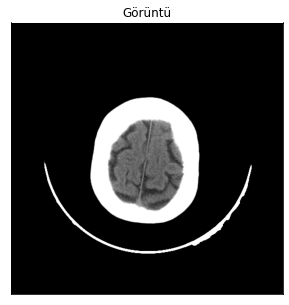

Prediction: False


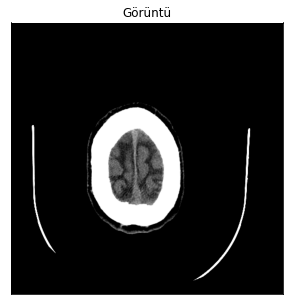

Prediction: False


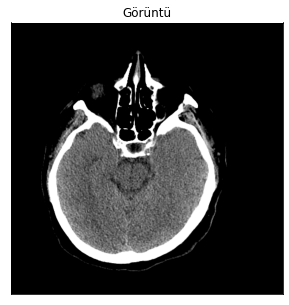

Prediction: False


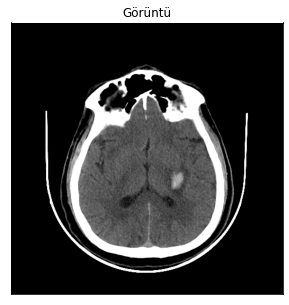

Prediction: True


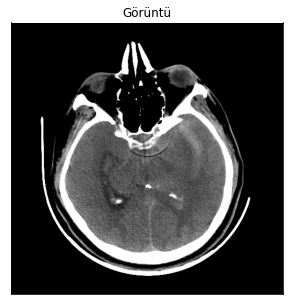

Prediction: True


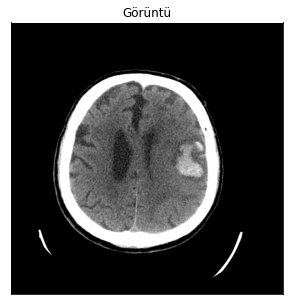

Prediction: True


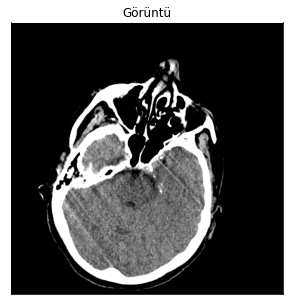

Prediction: False


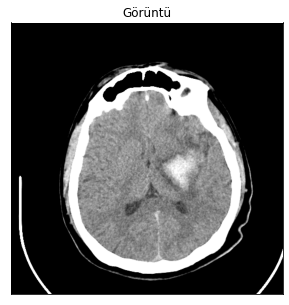

Prediction: True


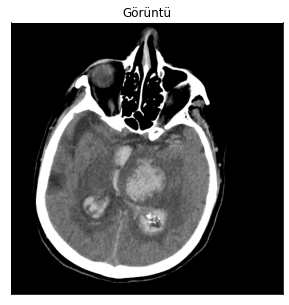

Prediction: True


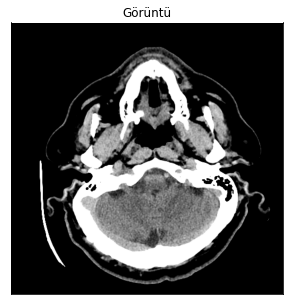

Prediction: False


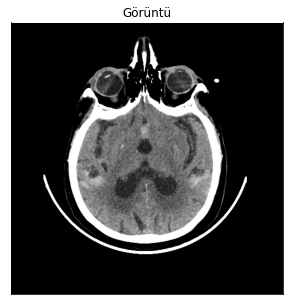

Prediction: True


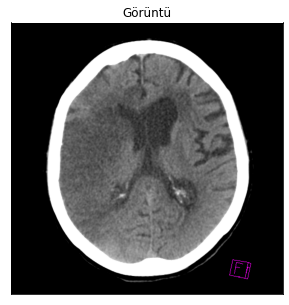

Prediction: True


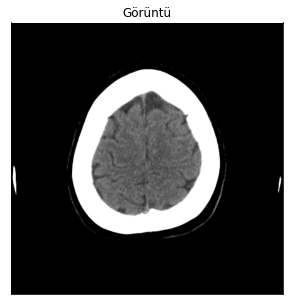

Prediction: False


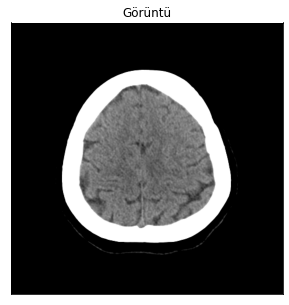

Prediction: False


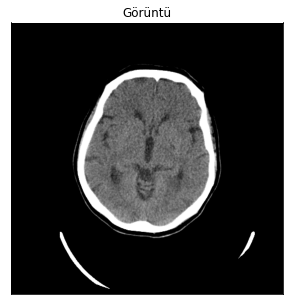

Prediction: False


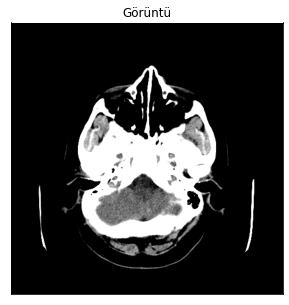

Prediction: False


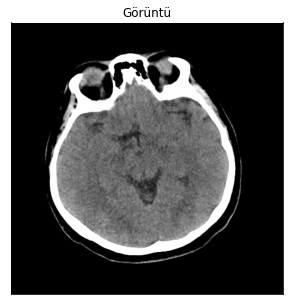

Prediction: False


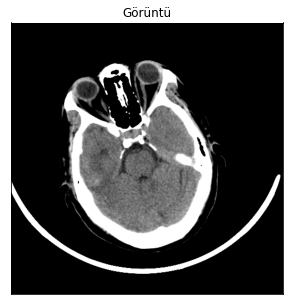

Prediction: True


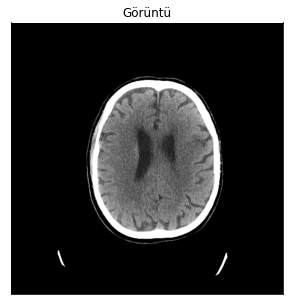

Prediction: True


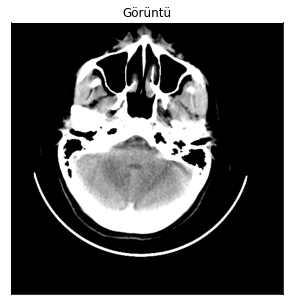

Prediction: False


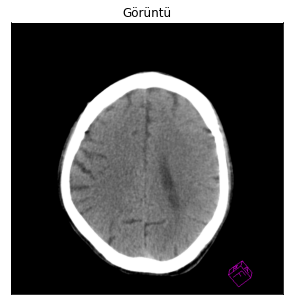

Prediction: True


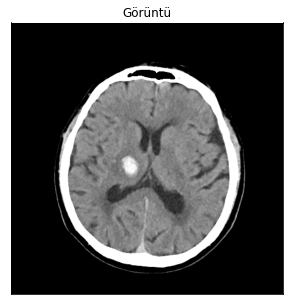

Prediction: True


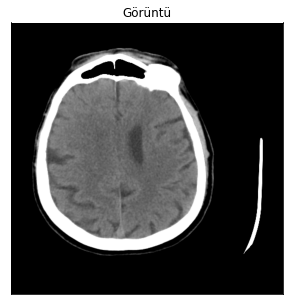

Prediction: False


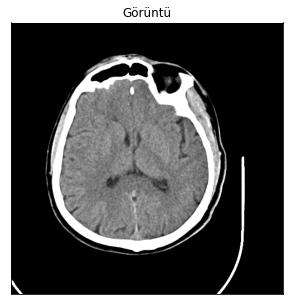

Prediction: False


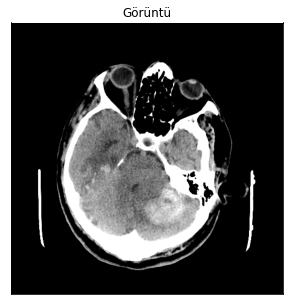

Prediction: True


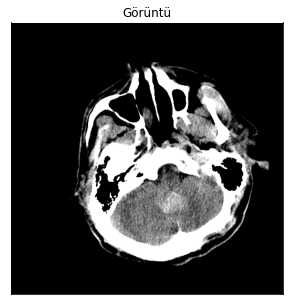

Prediction: True


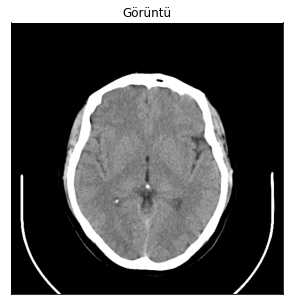

Prediction: False


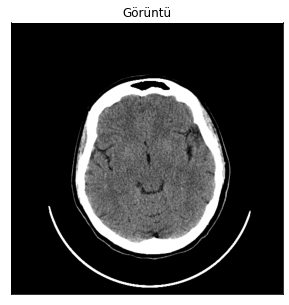

Prediction: False


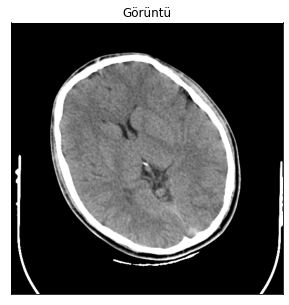

Prediction: False


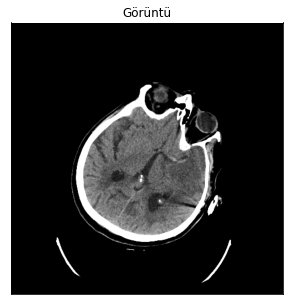

Prediction: True


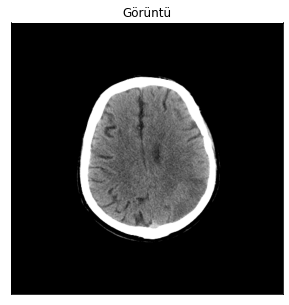

Prediction: False


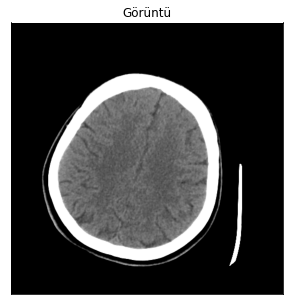

Prediction: False


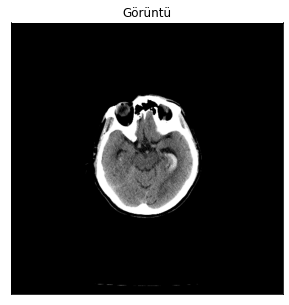

Prediction: True


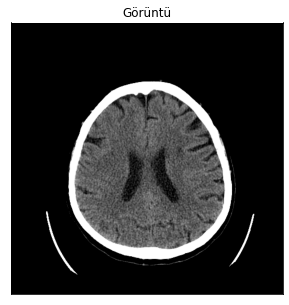

Prediction: False


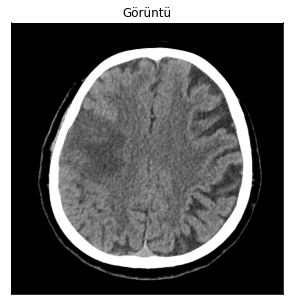

Prediction: True


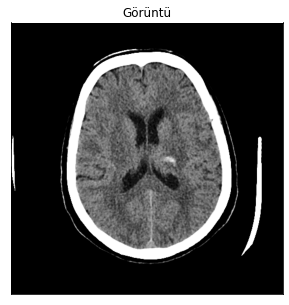

Prediction: True


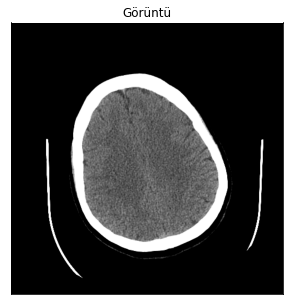

Prediction: False


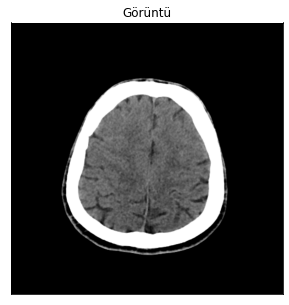

Prediction: False


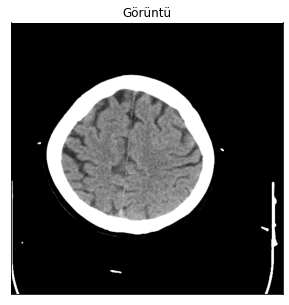

Prediction: False


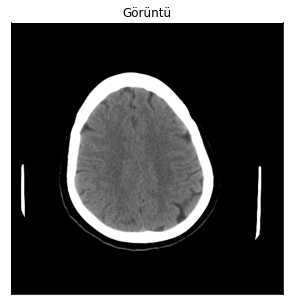

Prediction: False


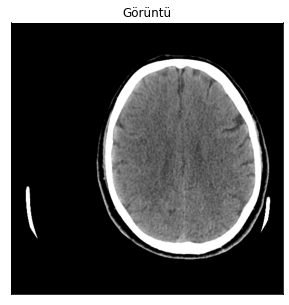

Prediction: False


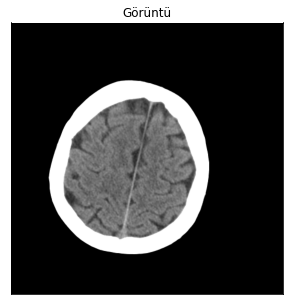

Prediction: False


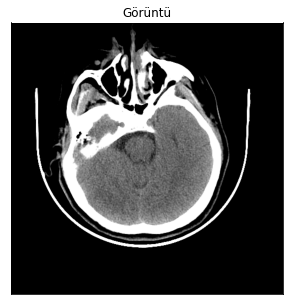

Prediction: False


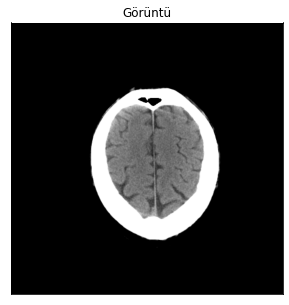

Prediction: False


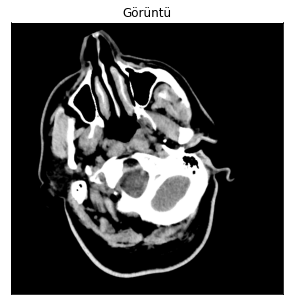

Prediction: False


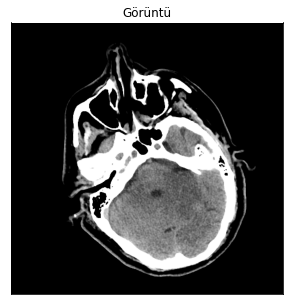

Prediction: True


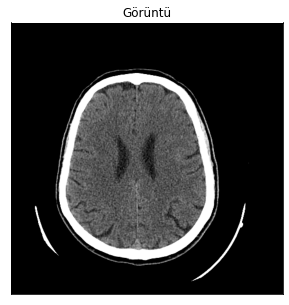

Prediction: False


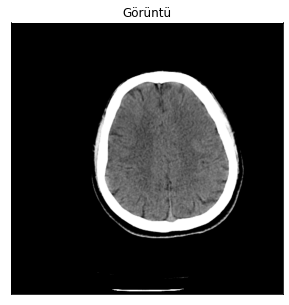

Prediction: False


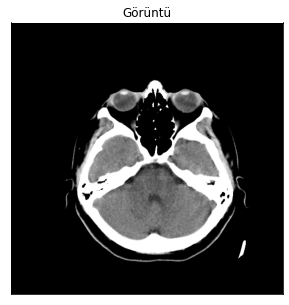

Prediction: False


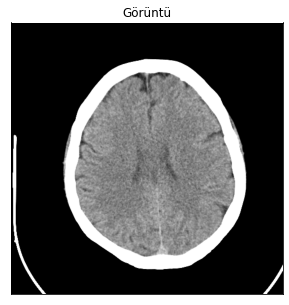

Prediction: False


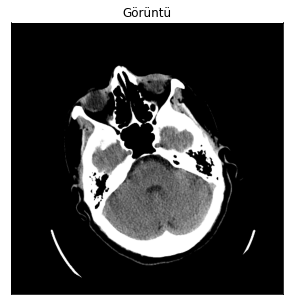

Prediction: False


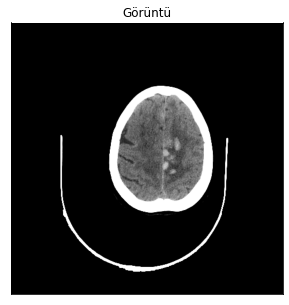

Prediction: True


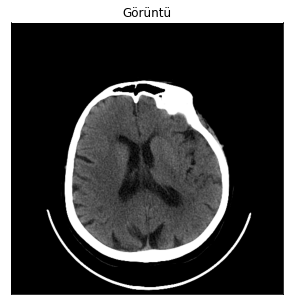

Prediction: True


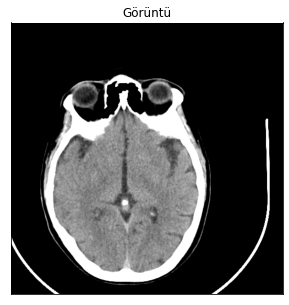

Prediction: False


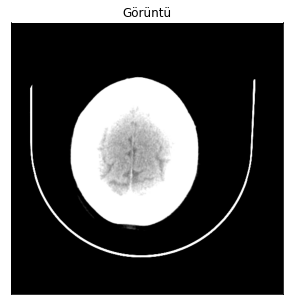

Prediction: False


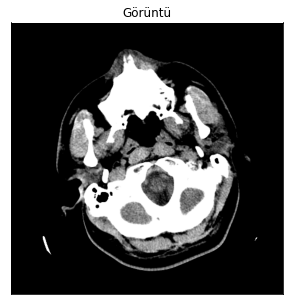

Prediction: False


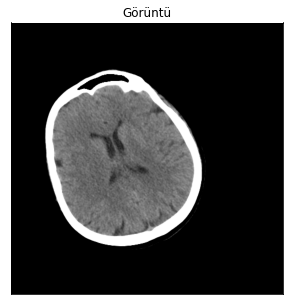

Prediction: False


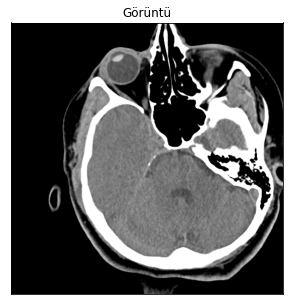

Prediction: False


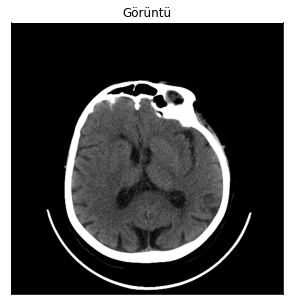

Prediction: True


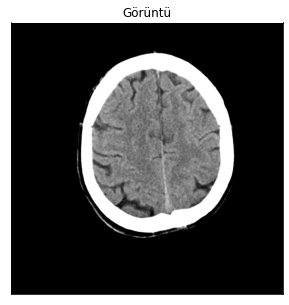

Prediction: False


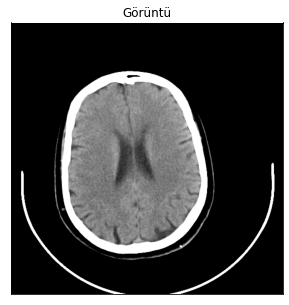

Prediction: False


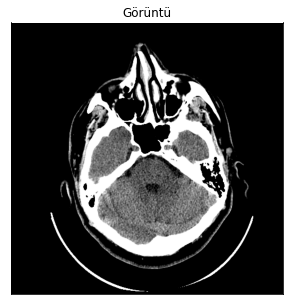

Prediction: False


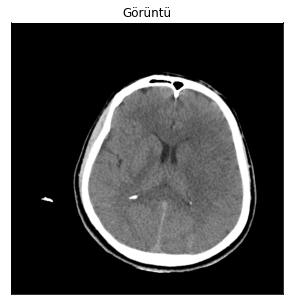

Prediction: True


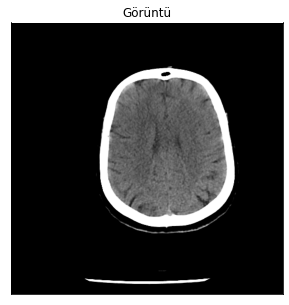

Prediction: False


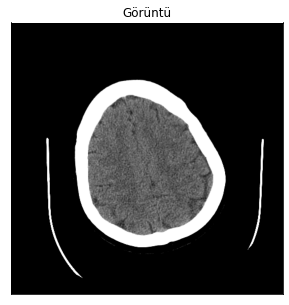

Prediction: False


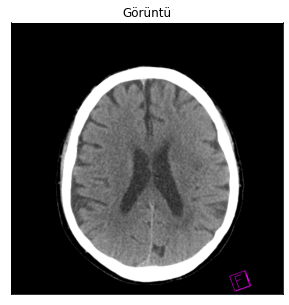

Prediction: True


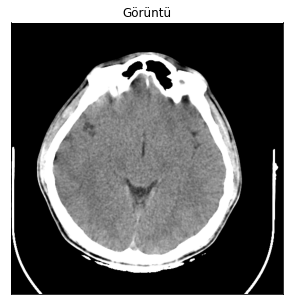

Prediction: False


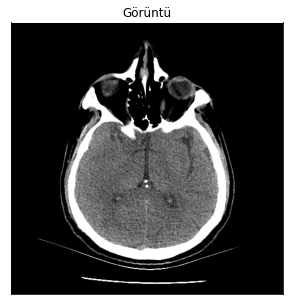

Prediction: False


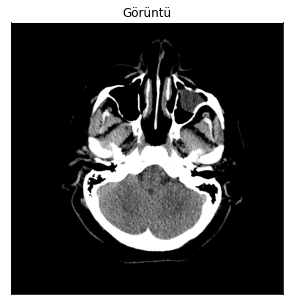

Prediction: False


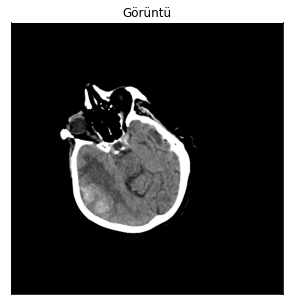

Prediction: True


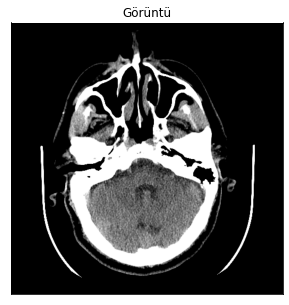

Prediction: False


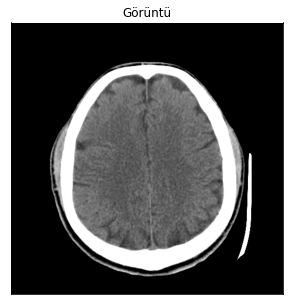

Prediction: False


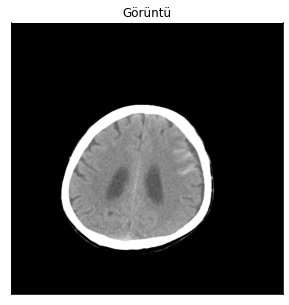

Prediction: True


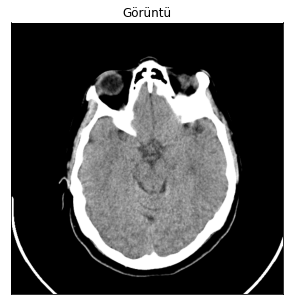

Prediction: False


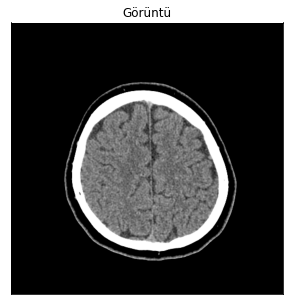

Prediction: False


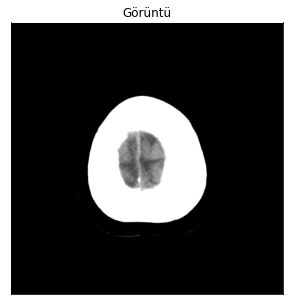

Prediction: False


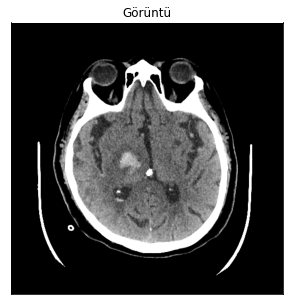

Prediction: True


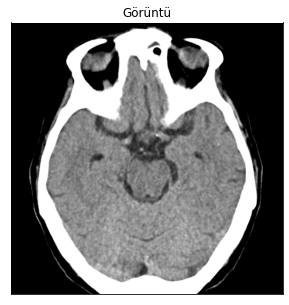

Prediction: False


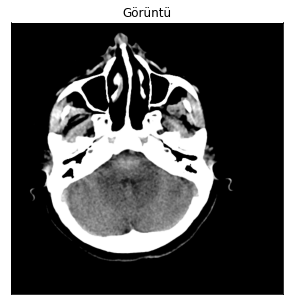

Prediction: False


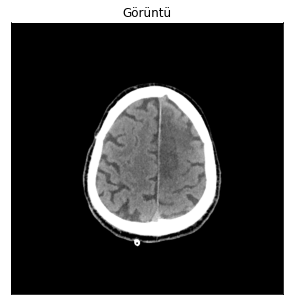

Prediction: True


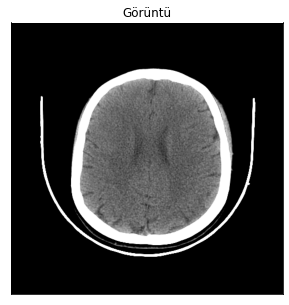

Prediction: False


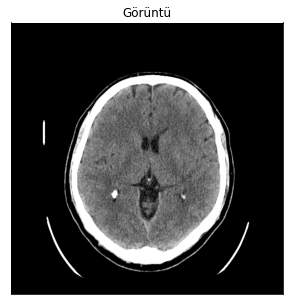

Prediction: False


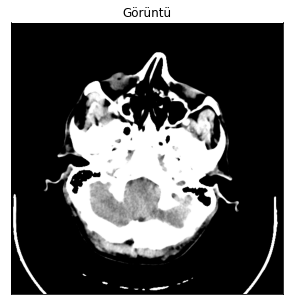

Prediction: False


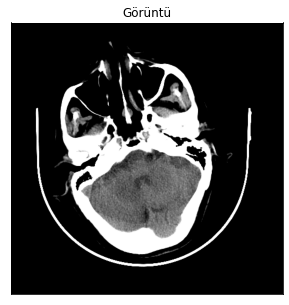

Prediction: False


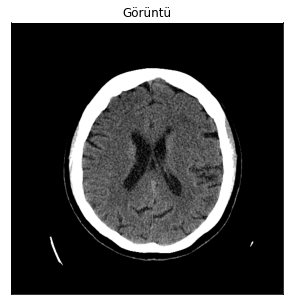

Prediction: False


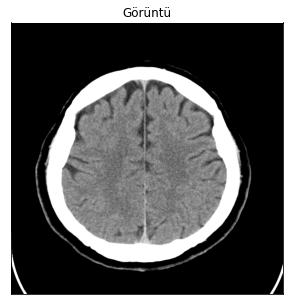

Prediction: False


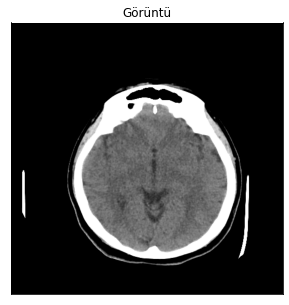

Prediction: False


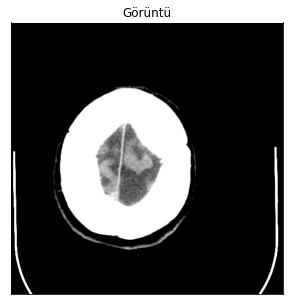

Prediction: False


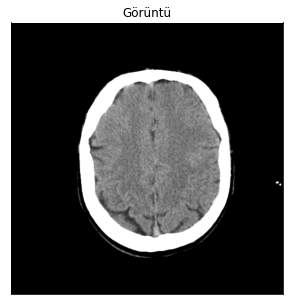

Prediction: False


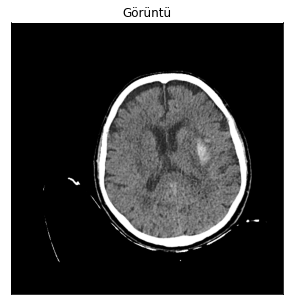

Prediction: True


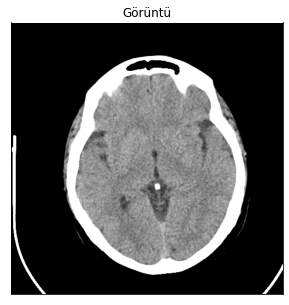

Prediction: False


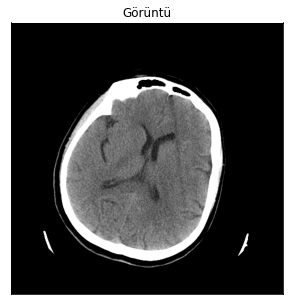

Prediction: False


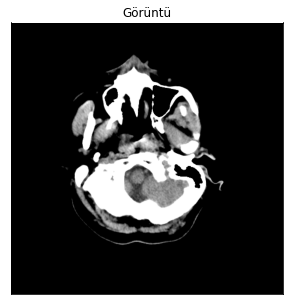

Prediction: False


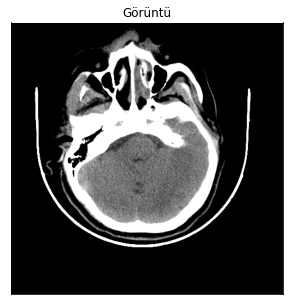

Prediction: False


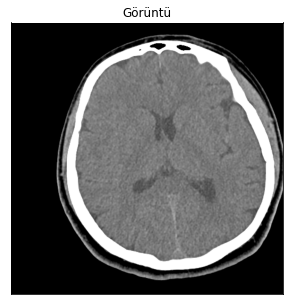

Prediction: False


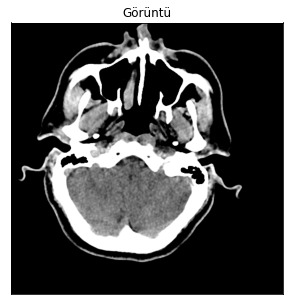

Prediction: False


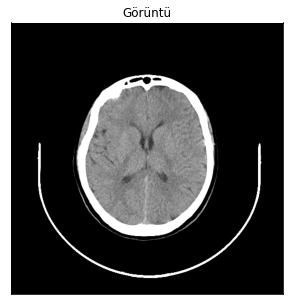

Prediction: False


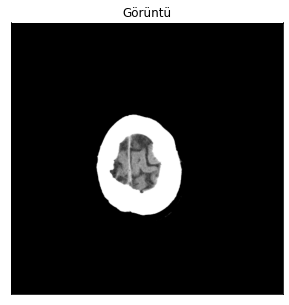

Prediction: False


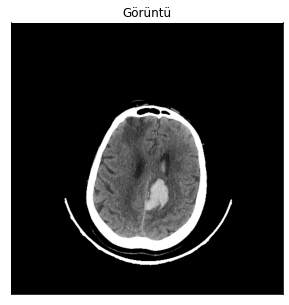

Prediction: True


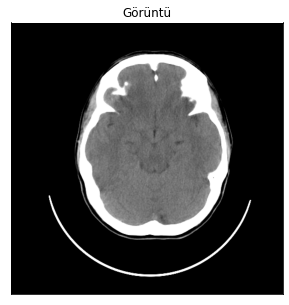

Prediction: False


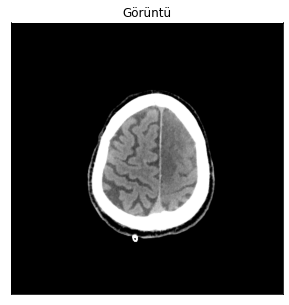

Prediction: True


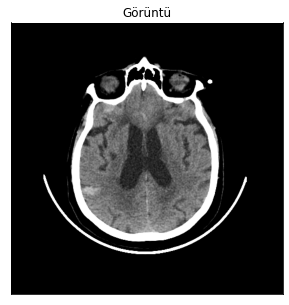

Prediction: True


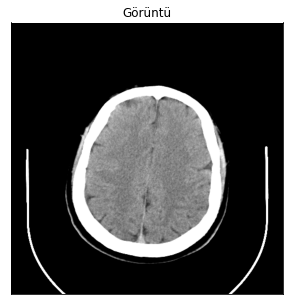

Prediction: False


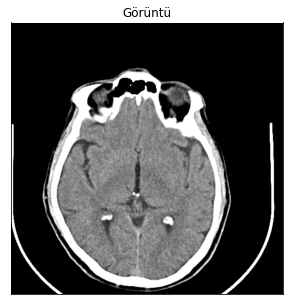

Prediction: False


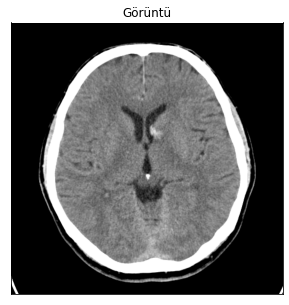

Prediction: False


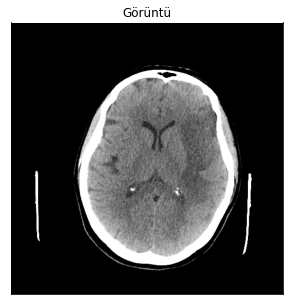

Prediction: True


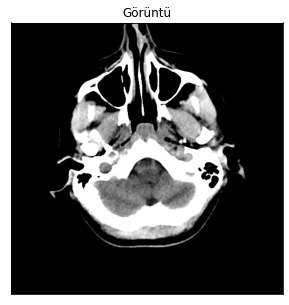

Prediction: False


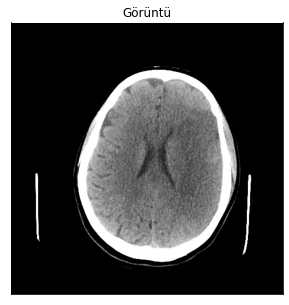

Prediction: False


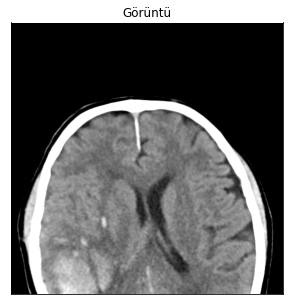

Prediction: True


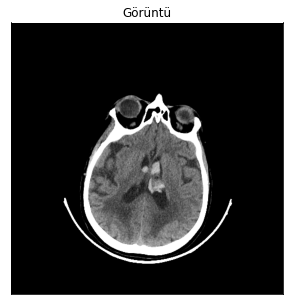

Prediction: True


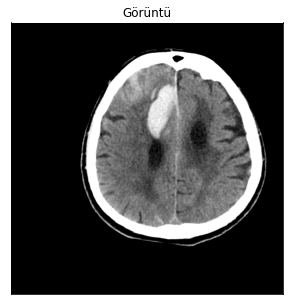

Prediction: True


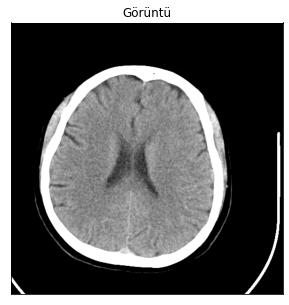

Prediction: False


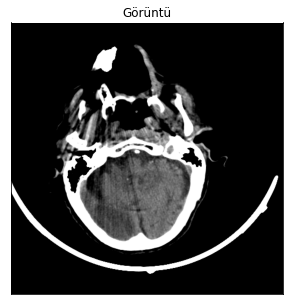

Prediction: True


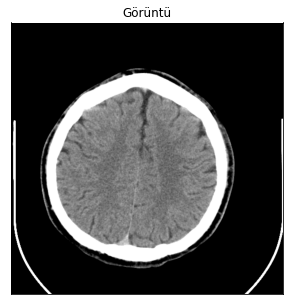

Prediction: False


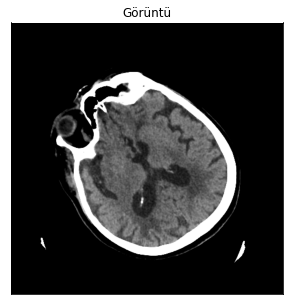

Prediction: True


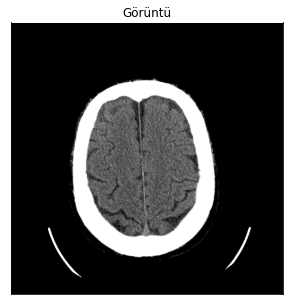

Prediction: False


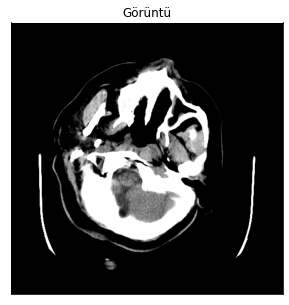

Prediction: False


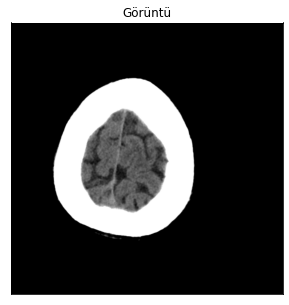

Prediction: False


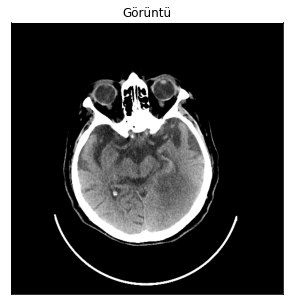

Prediction: True


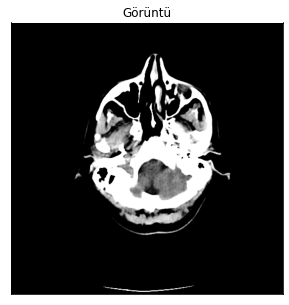

Prediction: False


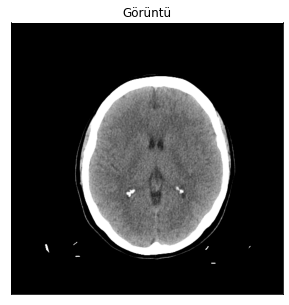

Prediction: False


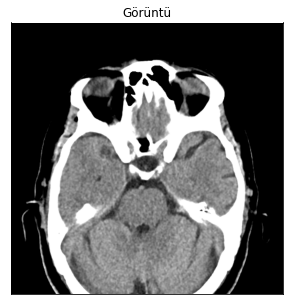

Prediction: False


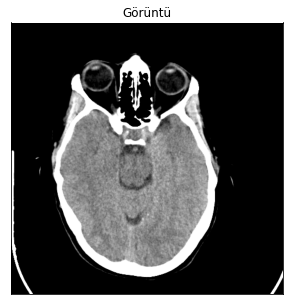

Prediction: False


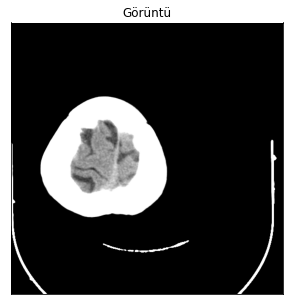

Prediction: False


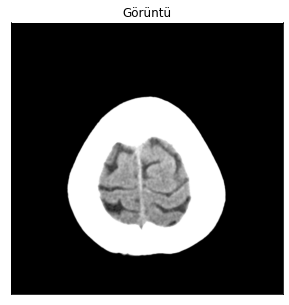

Prediction: False


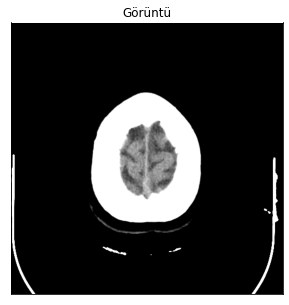

Prediction: False


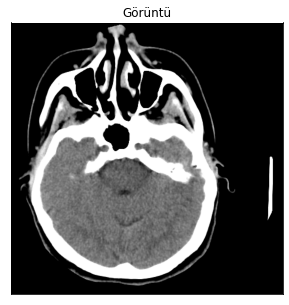

Prediction: False


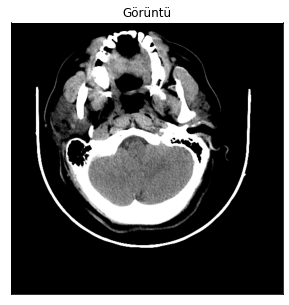

Prediction: False


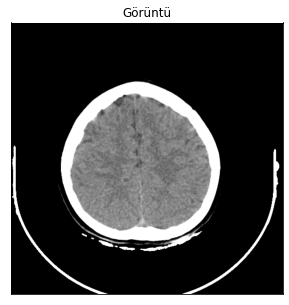

Prediction: False


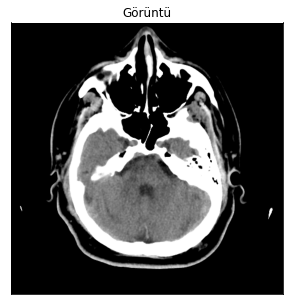

Prediction: False


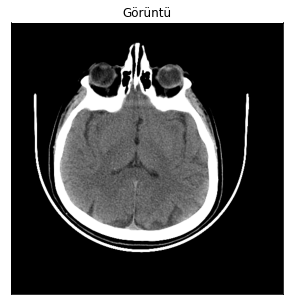

Prediction: False


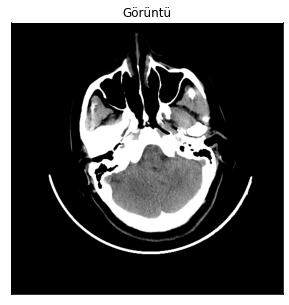

Prediction: False


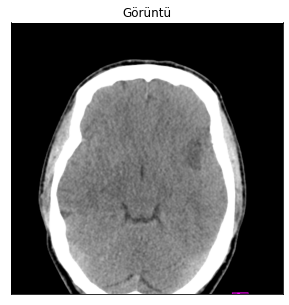

Prediction: True


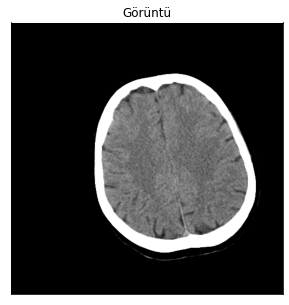

Prediction: False


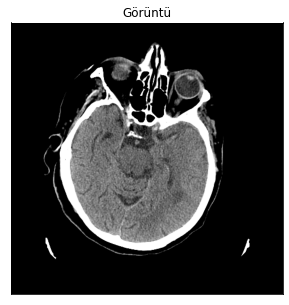

Prediction: False


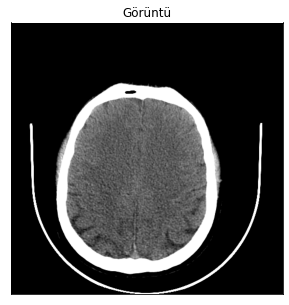

Prediction: False


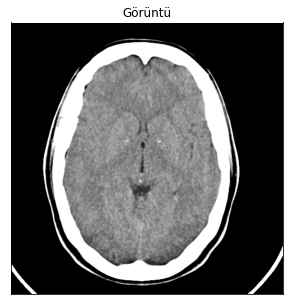

Prediction: False


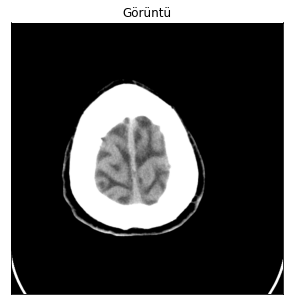

Prediction: False


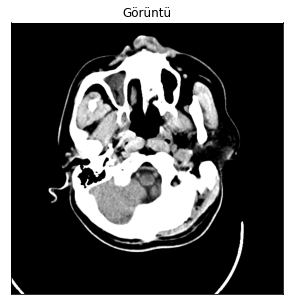

Prediction: False


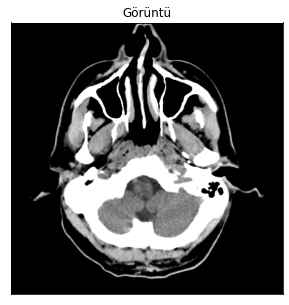

Prediction: False


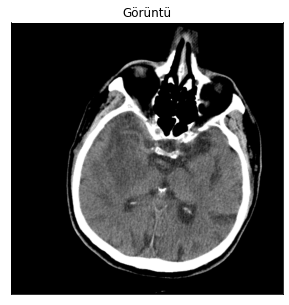

Prediction: True


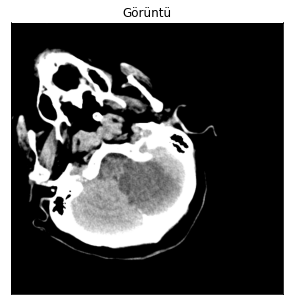

Prediction: True


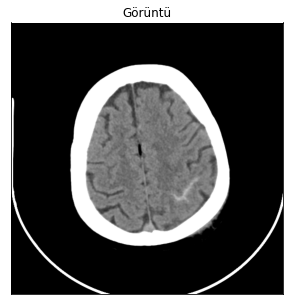

Prediction: True


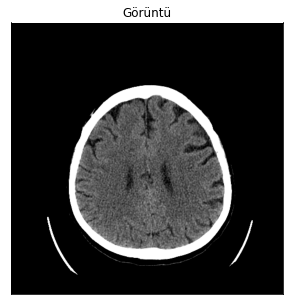

Prediction: False


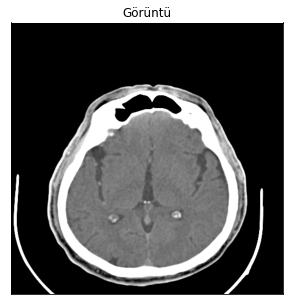

Prediction: False


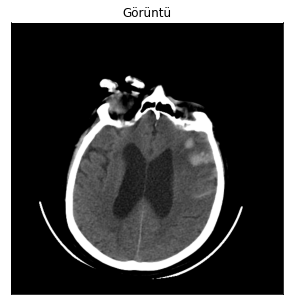

Prediction: True


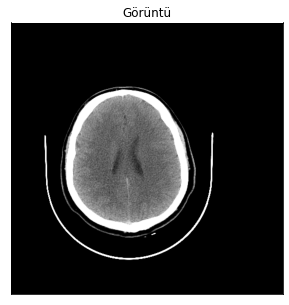

Prediction: False


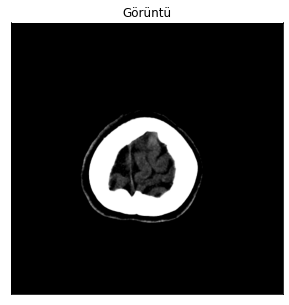

Prediction: False


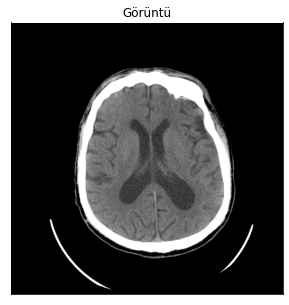

Prediction: False


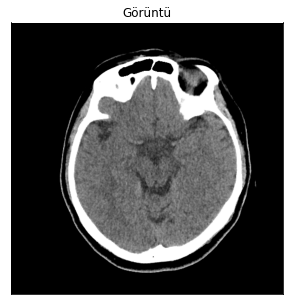

Prediction: False


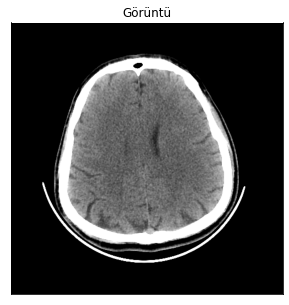

Prediction: False


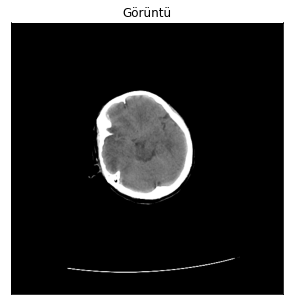

Prediction: True


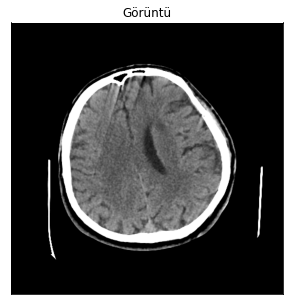

Prediction: False


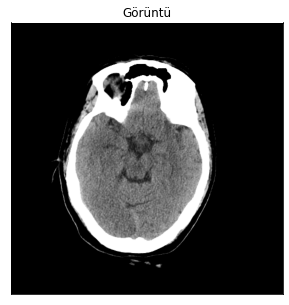

Prediction: True


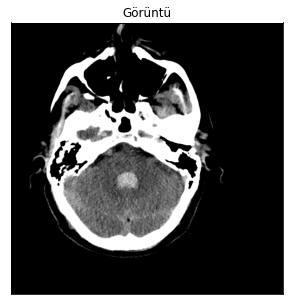

Prediction: True


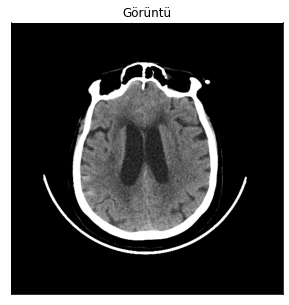

Prediction: True


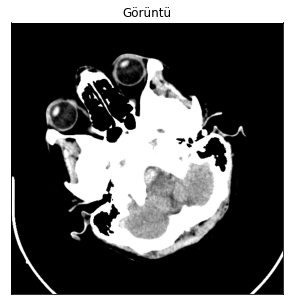

Prediction: True


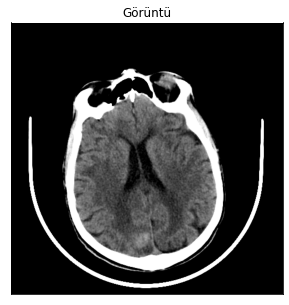

Prediction: False


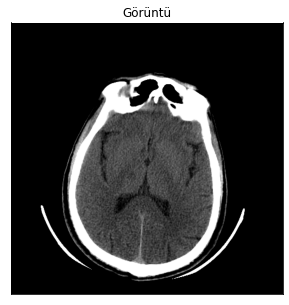

Prediction: True


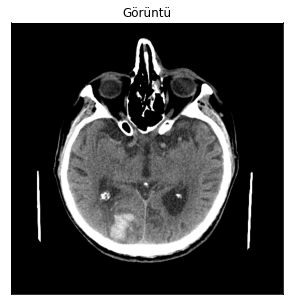

Prediction: True


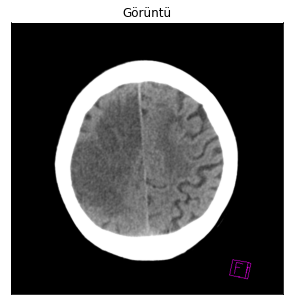

Prediction: True


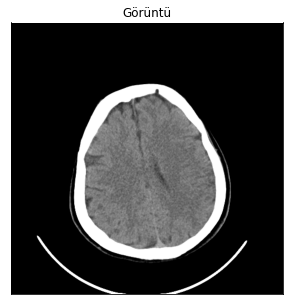

Prediction: False


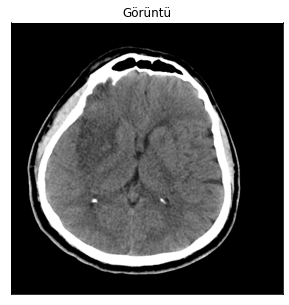

Prediction: False


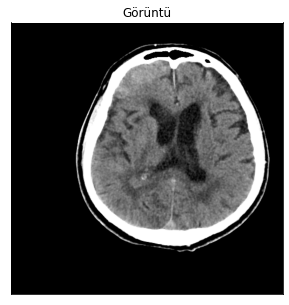

Prediction: True


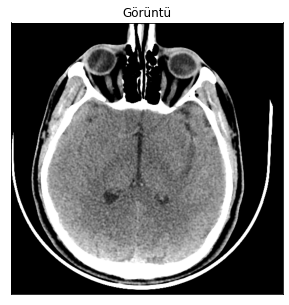

Prediction: True


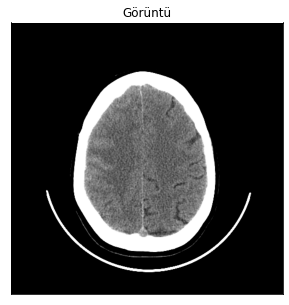

Prediction: True


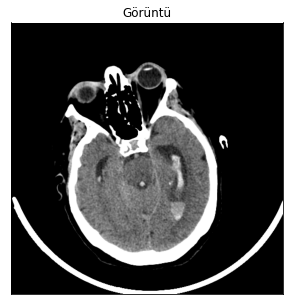

Prediction: True


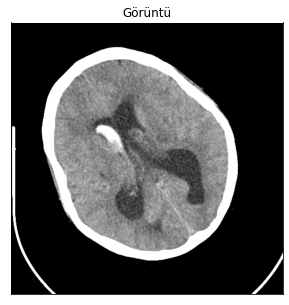

Prediction: True


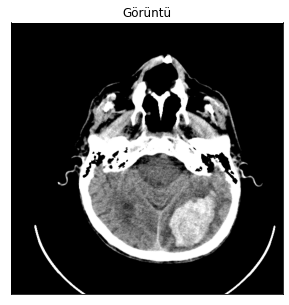

Prediction: True


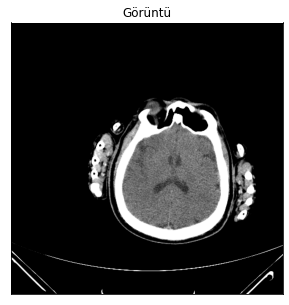

Prediction: True


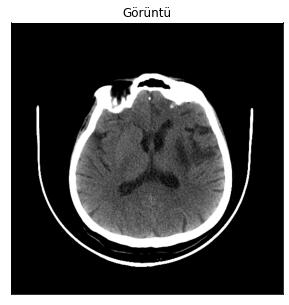

Prediction: True


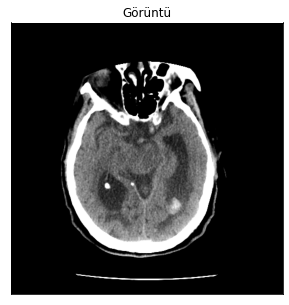

Prediction: True


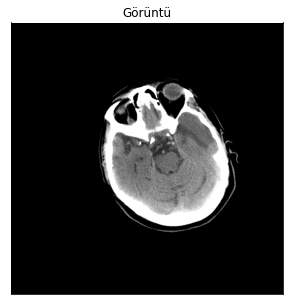

Prediction: True


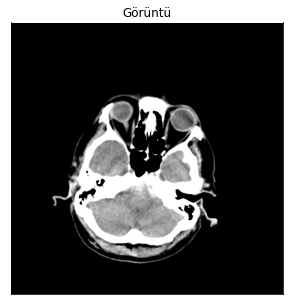

Prediction: True


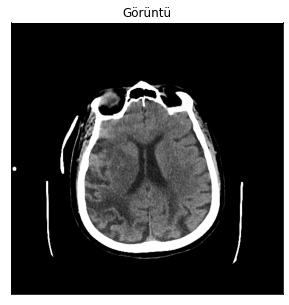

Prediction: True


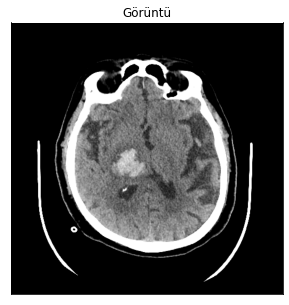

Prediction: True


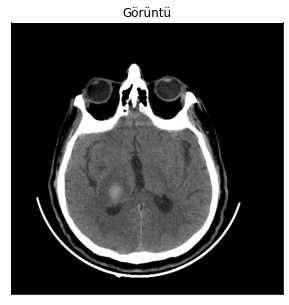

Prediction: True


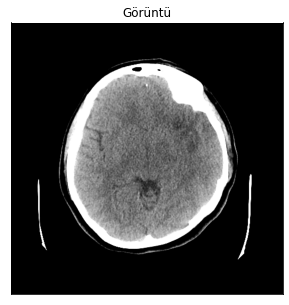

Prediction: False


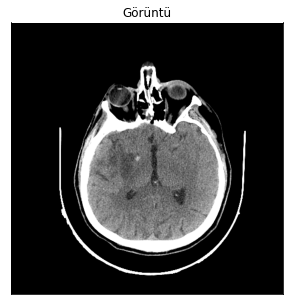

Prediction: True


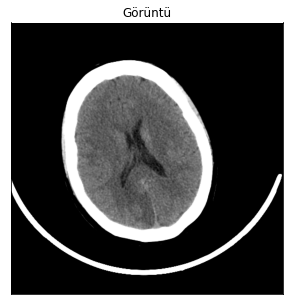

Prediction: True


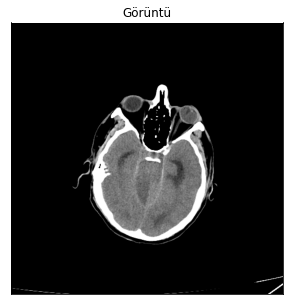

Prediction: True


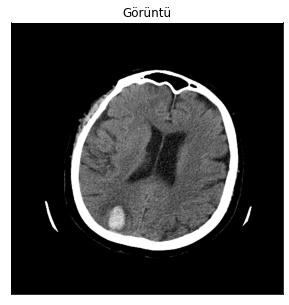

Prediction: True


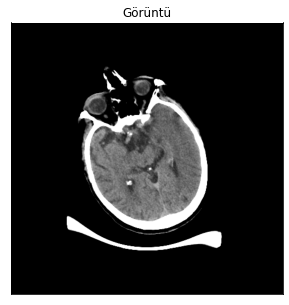

Prediction: True


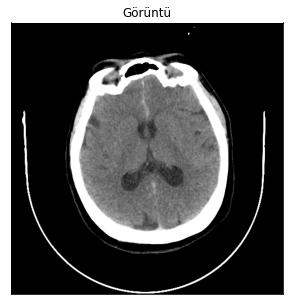

Prediction: True


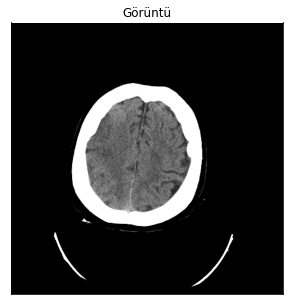

Prediction: True


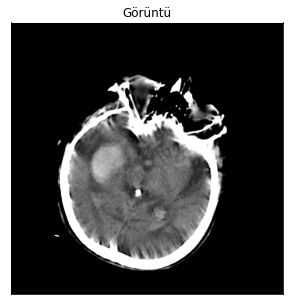

Prediction: True


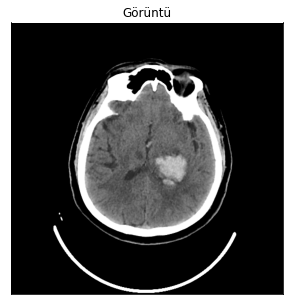

Prediction: True


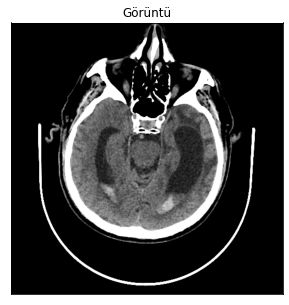

Prediction: True


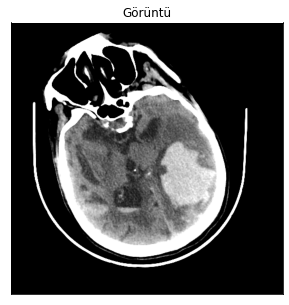

Prediction: True


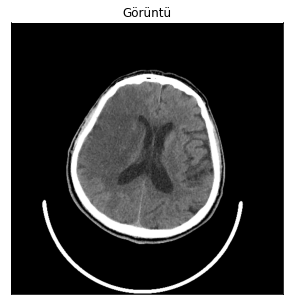

Prediction: True


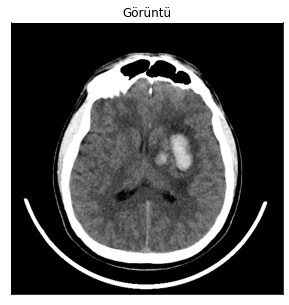

Prediction: True


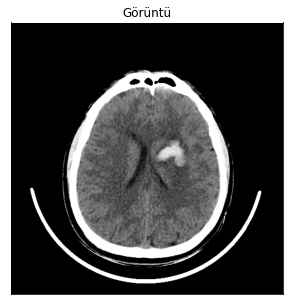

Prediction: True


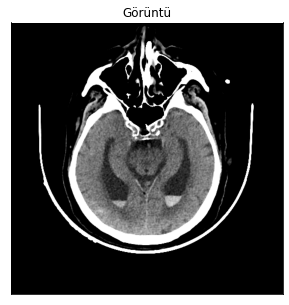

Prediction: True


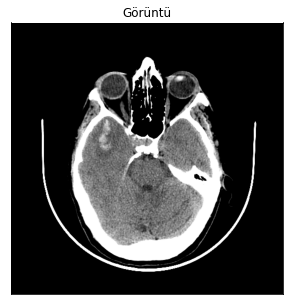

Prediction: True


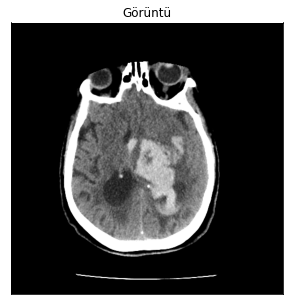

Prediction: True


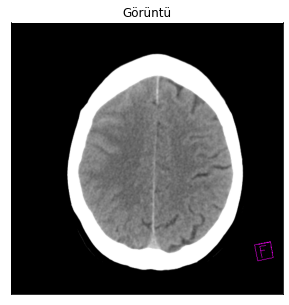

Prediction: True


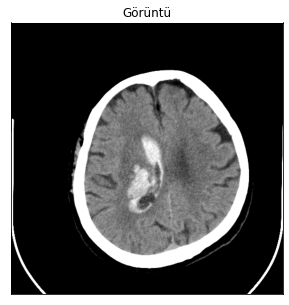

Prediction: True


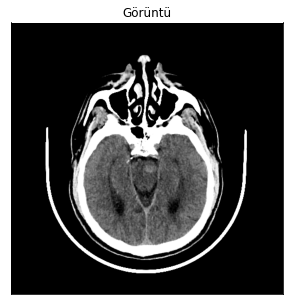

Prediction: True


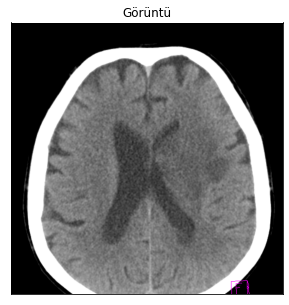

Prediction: True


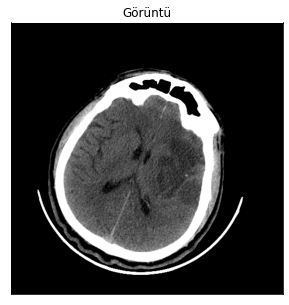

Prediction: True


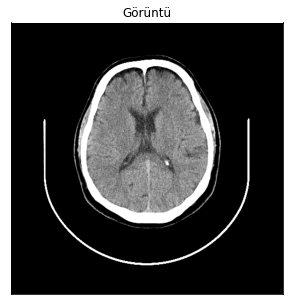

Prediction: True


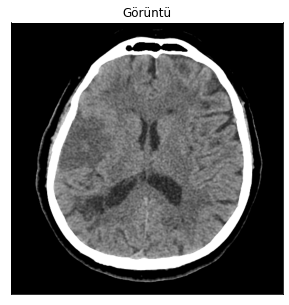

Prediction: True


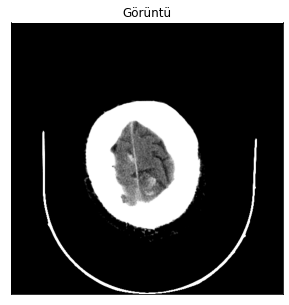

Prediction: False


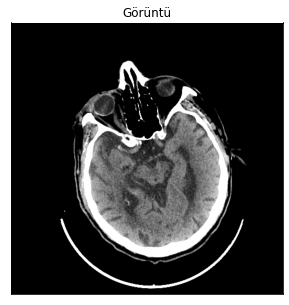

Prediction: True


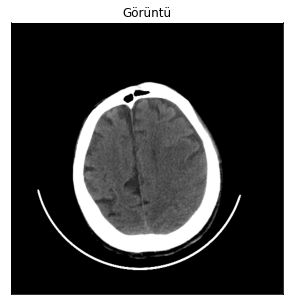

Prediction: True


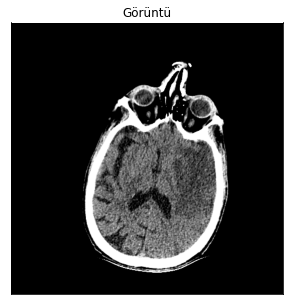

Prediction: True


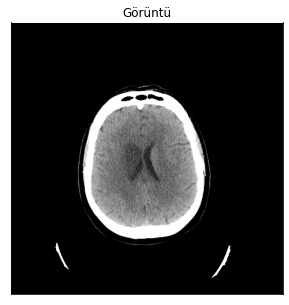

Prediction: True


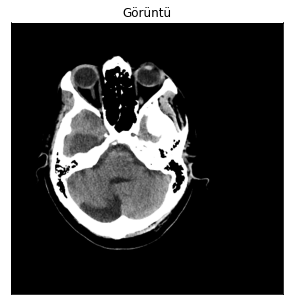

Prediction: True


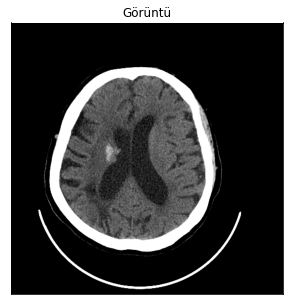

Prediction: True


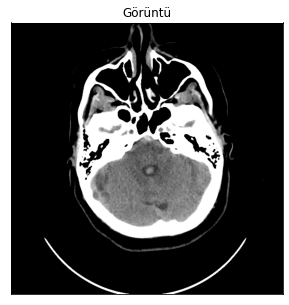

Prediction: True


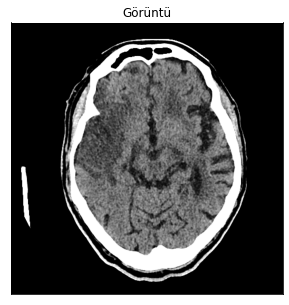

Prediction: False


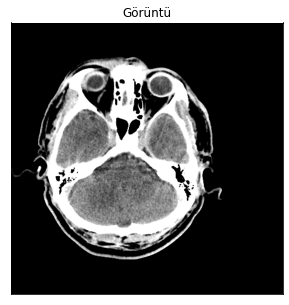

Prediction: True


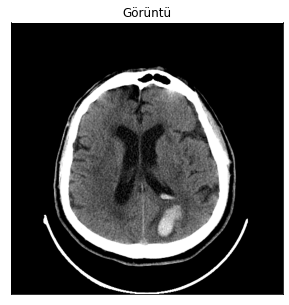

Prediction: True


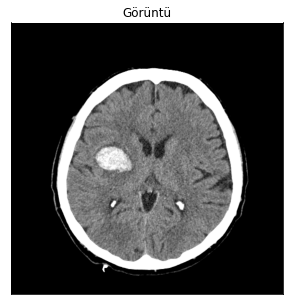

Prediction: True


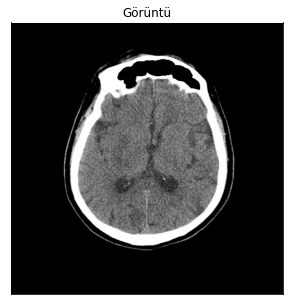

Prediction: True


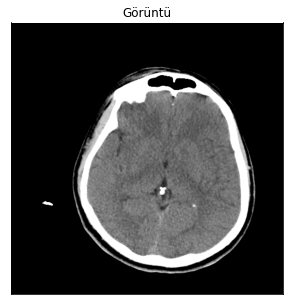

Prediction: True


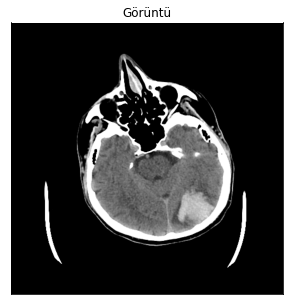

Prediction: True


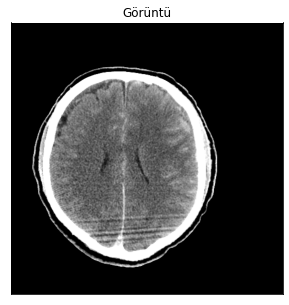

Prediction: True


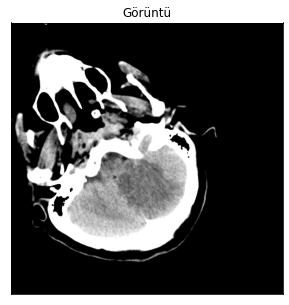

Prediction: True


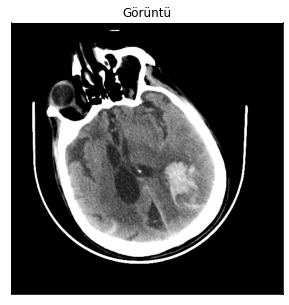

Prediction: True


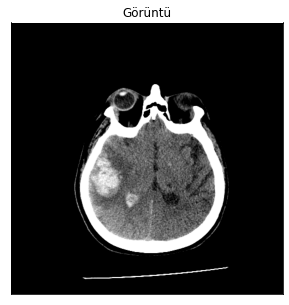

Prediction: True


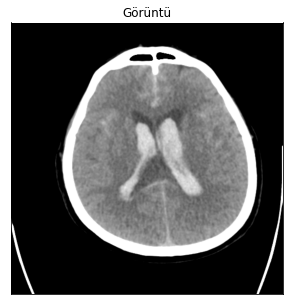

Prediction: True


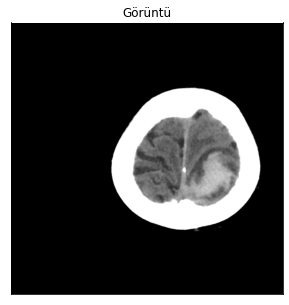

Prediction: True


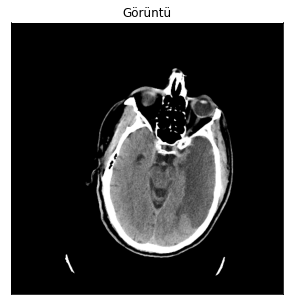

Prediction: True


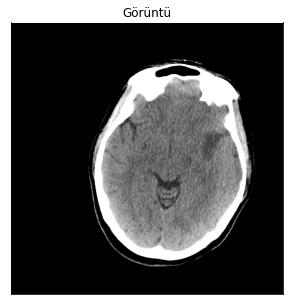

Prediction: True


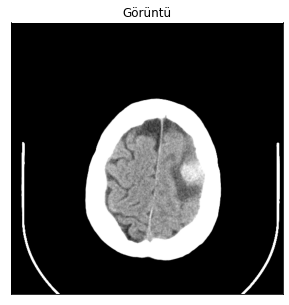

Prediction: True


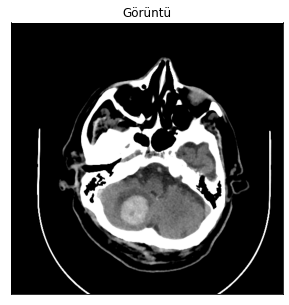

Prediction: True


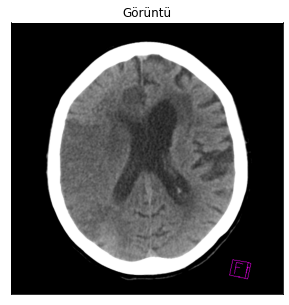

Prediction: True
İnme yok sayısı 122,  inme var sayısı 144


In [10]:
predict_filenames = tf.io.gfile.glob(f"{test_dir}*.{IMG_EXT}")
predict_filenames = predict_filenames[:]
predict_filenames = sorted(predict_filenames)
ids = []
labels = []
inme_yok = 0
inme_var = 0

for i in predict_filenames:
    img = cv2.imread(i)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    img = np.expand_dims(img, axis=0)

    prediction = model.predict(img)
    prediction = prediction[0, 0]

    if prediction < 0.5:
            labels.append(1)
    else:
        labels.append(0)
    
    if "verbose" in FLAGS:
        visualize(Görüntü=img.squeeze())
        print(f"Prediction: {prediction > 0.5}")

    ids.append(i.replace(test_dir, '').split('.')[0])

for i in labels:
    if i == 1:
        inme_var += 1
    else:
        inme_yok += 1
print(f"İnme yok sayısı {inme_yok},  inme var sayısı {inme_var}")
tuplee = list(zip(ids, labels)) 
dataframe = pd.DataFrame(tuplee, columns=['ID', 'ETİKET'])
dataframe.to_csv('OTURUM1.csv', index=False, encoding='utf-8')
